# 02 - CLIP Baseline: Zero-Shot Text-to-Image Retrieval

Evaluate two CLIP models (ViT-B/32 and ViT-B/16) on Flickr30k Karpathy test split.

- Extract & cache image/text embeddings
- Compute Recall@1/5/10, MedianR, MeanR
- Qualitative analysis: best/worst retrievals
- Embedding space visualization

## 1. Setup

In [1]:
import sys
from pathlib import Path

# Add project root to path
PROJECT_ROOT = Path.cwd().parent
if str(PROJECT_ROOT) not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT))

import numpy as np
import matplotlib.pyplot as plt
import torch

from src.config import CLIP_MODELS, DEFAULT_CLIP_MODEL, TOP_K_VALUES, BATCH_SIZE
from src.data import load_karpathy_splits, get_all_captions_flat, get_image, get_captions
from src.clip_embeddings import (
    load_clip_model, encode_images, encode_texts,
    extract_and_cache_images, extract_and_cache_texts,
    save_embeddings, load_embeddings,
)
from src.retrieval import text_to_image_search, text_to_image_search_batch, get_ranks
from src.evaluation import evaluate_text_to_image, random_baseline, save_results, print_results_table
from src.visualize import (
    plot_retrieval_results, plot_recall_comparison, plot_rank_distribution,
    plot_text_image_similarity_distribution, plot_tsne, plot_similarity_distribution,
)

%matplotlib inline
plt.rcParams["figure.dpi"] = 100

In [2]:
splits = load_karpathy_splits()
print(f"\nSplit sizes:")
for name, ds in splits.items():
    print(f"  {name}: {len(ds)} images")

  train: 29000 images


  val: 1014 images
  test: 1000 images

Split sizes:
  train: 29000 images
  val: 1014 images
  test: 1000 images


In [3]:
test_captions, gt_indices = get_all_captions_flat(splits["test"])
print(f"Test captions: {len(test_captions)}")
print(f"Test images:   {len(splits['test'])}")
print(f"GT indices shape: {gt_indices.shape}")
print(f"\nExample caption: {test_captions[0]}")
print(f"Maps to image index: {gt_indices[0]}")

Test captions: 5000
Test images:   1000
GT indices shape: (5000,)

Example caption: The man with pierced ears is wearing glasses and an orange hat .
Maps to image index: 0


## 2. CLIP ViT-B/32 Embedding Extraction

In [4]:
model_b32, processor_b32 = load_clip_model("clip-vit-b-32")
print(f"Model: {CLIP_MODELS['clip-vit-b-32']}")
print(f"Device: {next(model_b32.parameters()).device}")

Loading weights:   0%|          | 0/398 [00:00<?, ?it/s]

CLIPModel LOAD REPORT from: openai/clip-vit-base-patch32
Key                                  | Status     |  | 
-------------------------------------+------------+--+-
text_model.embeddings.position_ids   | UNEXPECTED |  | 
vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Model: openai/clip-vit-base-patch32
Device: mps:0


In [5]:
img_emb_b32 = extract_and_cache_images(splits["test"], "clip-vit-b-32", split="test")
print(f"Image embeddings shape: {img_emb_b32.shape}")

Loading weights:   0%|          | 0/398 [00:00<?, ?it/s]

CLIPModel LOAD REPORT from: openai/clip-vit-base-patch32
Key                                  | Status     |  | 
-------------------------------------+------------+--+-
text_model.embeddings.position_ids   | UNEXPECTED |  | 
vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Encoding images:   0%|          | 0/16 [00:00<?, ?it/s]

Encoding images:   6%|▋         | 1/16 [00:00<00:07,  1.90it/s]

Encoding images:  12%|█▎        | 2/16 [00:00<00:05,  2.64it/s]

Encoding images:  19%|█▉        | 3/16 [00:01<00:04,  3.09it/s]

Encoding images:  25%|██▌       | 4/16 [00:01<00:03,  3.39it/s]

Encoding images:  31%|███▏      | 5/16 [00:01<00:03,  3.59it/s]

Encoding images:  38%|███▊      | 6/16 [00:01<00:02,  3.72it/s]

Encoding images:  44%|████▍     | 7/16 [00:02<00:02,  3.78it/s]

Encoding images:  50%|█████     | 8/16 [00:02<00:02,  3.83it/s]

Encoding images:  56%|█████▋    | 9/16 [00:02<00:01,  3.85it/s]

Encoding images:  62%|██████▎   | 10/16 [00:02<00:01,  3.89it/s]

Encoding images:  69%|██████▉   | 11/16 [00:03<00:01,  3.96it/s]

Encoding images:  75%|███████▌  | 12/16 [00:03<00:00,  4.02it/s]

Encoding images:  81%|████████▏ | 13/16 [00:03<00:00,  4.06it/s]

Encoding images:  88%|████████▊ | 14/16 [00:03<00:00,  4.03it/s]

Encoding images:  94%|█████████▍| 15/16 [00:04<00:00,  4.07it/s]

Encoding images: 100%|██████████| 16/16 [00:04<00:00,  4.44it/s]

Encoding images: 100%|██████████| 16/16 [00:04<00:00,  3.79it/s]

Saved (1000, 512) to /Users/andrejvysny/fiit/nsiete/NSIETE_2026/Project2/data/embeddings/clip-vit-b-32_images_test.npy
Image embeddings shape: (1000, 512)


In [6]:
txt_emb_b32 = extract_and_cache_texts(test_captions, "clip-vit-b-32", split="test")
print(f"Text embeddings shape: {txt_emb_b32.shape}")

Loading weights:   0%|          | 0/398 [00:00<?, ?it/s]

CLIPModel LOAD REPORT from: openai/clip-vit-base-patch32
Key                                  | Status     |  | 
-------------------------------------+------------+--+-
text_model.embeddings.position_ids   | UNEXPECTED |  | 
vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Encoding texts:   0%|          | 0/79 [00:00<?, ?it/s]

Encoding texts:   1%|▏         | 1/79 [00:00<00:37,  2.09it/s]

Encoding texts:   4%|▍         | 3/79 [00:00<00:13,  5.78it/s]

Encoding texts:   6%|▋         | 5/79 [00:00<00:08,  8.71it/s]

Encoding texts:   9%|▉         | 7/79 [00:00<00:06, 10.74it/s]

Encoding texts:  13%|█▎        | 10/79 [00:00<00:04, 14.16it/s]

Encoding texts:  16%|█▋        | 13/79 [00:01<00:03, 16.99it/s]

Encoding texts:  19%|█▉        | 15/79 [00:01<00:03, 17.56it/s]

Encoding texts:  23%|██▎       | 18/79 [00:01<00:03, 20.00it/s]

Encoding texts:  27%|██▋       | 21/79 [00:01<00:02, 20.39it/s]

Encoding texts:  30%|███       | 24/79 [00:01<00:02, 19.75it/s]

Encoding texts:  34%|███▍      | 27/79 [00:01<00:02, 18.22it/s]

Encoding texts:  37%|███▋      | 29/79 [00:01<00:02, 17.69it/s]

Encoding texts:  41%|████      | 32/79 [00:02<00:02, 19.44it/s]

Encoding texts:  44%|████▍     | 35/79 [00:02<00:02, 20.93it/s]

Encoding texts:  48%|████▊     | 38/79 [00:02<00:01, 21.95it/s]

Encoding texts:  52%|█████▏    | 41/79 [00:02<00:01, 22.18it/s]

Encoding texts:  56%|█████▌    | 44/79 [00:02<00:01, 21.95it/s]

Encoding texts:  59%|█████▉    | 47/79 [00:02<00:01, 22.69it/s]

Encoding texts:  63%|██████▎   | 50/79 [00:02<00:01, 23.44it/s]

Encoding texts:  67%|██████▋   | 53/79 [00:02<00:01, 21.71it/s]

Encoding texts:  71%|███████   | 56/79 [00:03<00:01, 21.21it/s]

Encoding texts:  75%|███████▍  | 59/79 [00:03<00:00, 22.68it/s]

Encoding texts:  78%|███████▊  | 62/79 [00:03<00:00, 18.51it/s]

Encoding texts:  82%|████████▏ | 65/79 [00:03<00:00, 19.95it/s]

Encoding texts:  86%|████████▌ | 68/79 [00:03<00:00, 17.84it/s]

Encoding texts:  89%|████████▊ | 70/79 [00:03<00:00, 17.48it/s]

Encoding texts:  91%|█████████ | 72/79 [00:04<00:00, 17.09it/s]

Encoding texts:  95%|█████████▍| 75/79 [00:04<00:00, 17.61it/s]

Encoding texts:  99%|█████████▊| 78/79 [00:04<00:00, 17.85it/s]

Encoding texts: 100%|██████████| 79/79 [00:04<00:00, 17.05it/s]

Saved (5000, 512) to /Users/andrejvysny/fiit/nsiete/NSIETE_2026/Project2/data/embeddings/clip-vit-b-32_texts_test.npy
Text embeddings shape: (5000, 512)


In [7]:
# Verify L2 norms are ~1.0
img_norms = np.linalg.norm(img_emb_b32, axis=1)
txt_norms = np.linalg.norm(txt_emb_b32, axis=1)
print(f"Image embedding norms: mean={img_norms.mean():.4f}, std={img_norms.std():.6f}")
print(f"Text embedding norms:  mean={txt_norms.mean():.4f}, std={txt_norms.std():.6f}")

Image embedding norms: mean=1.0000, std=0.000000
Text embedding norms:  mean=1.0000, std=0.000000


In [8]:
del model_b32, processor_b32
torch.cuda.empty_cache()
print("B/32 model freed.")

B/32 model freed.


## 3. CLIP ViT-B/16 Embedding Extraction

In [9]:
model_b16, processor_b16 = load_clip_model("clip-vit-b-16")
print(f"Model: {CLIP_MODELS['clip-vit-b-16']}")
print(f"Device: {next(model_b16.parameters()).device}")

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

tokenizer_config.json:   0%|          | 0.00/905 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/599M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/398 [00:00<?, ?it/s]

CLIPModel LOAD REPORT from: openai/clip-vit-base-patch16
Key                                  | Status     |  | 
-------------------------------------+------------+--+-
text_model.embeddings.position_ids   | UNEXPECTED |  | 
vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Model: openai/clip-vit-base-patch16
Device: mps:0


In [10]:
img_emb_b16 = extract_and_cache_images(splits["test"], "clip-vit-b-16", split="test")
print(f"Image embeddings shape: {img_emb_b16.shape}")

model.safetensors:   0%|          | 0.00/599M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/398 [00:00<?, ?it/s]

CLIPModel LOAD REPORT from: openai/clip-vit-base-patch16
Key                                  | Status     |  | 
-------------------------------------+------------+--+-
text_model.embeddings.position_ids   | UNEXPECTED |  | 
vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Encoding images:   0%|          | 0/16 [00:00<?, ?it/s]

Encoding images:   6%|▋         | 1/16 [00:00<00:11,  1.33it/s]

Encoding images:  12%|█▎        | 2/16 [00:01<00:09,  1.46it/s]

Encoding images:  19%|█▉        | 3/16 [00:02<00:08,  1.54it/s]

Encoding images:  25%|██▌       | 4/16 [00:02<00:07,  1.56it/s]

Encoding images:  31%|███▏      | 5/16 [00:03<00:07,  1.57it/s]

Encoding images:  38%|███▊      | 6/16 [00:03<00:06,  1.57it/s]

Encoding images:  44%|████▍     | 7/16 [00:04<00:05,  1.57it/s]

Encoding images:  50%|█████     | 8/16 [00:05<00:05,  1.58it/s]

Encoding images:  56%|█████▋    | 9/16 [00:05<00:04,  1.59it/s]

Encoding images:  62%|██████▎   | 10/16 [00:06<00:03,  1.61it/s]

Encoding images:  69%|██████▉   | 11/16 [00:07<00:03,  1.59it/s]

Encoding images:  75%|███████▌  | 12/16 [00:07<00:02,  1.57it/s]

Encoding images:  81%|████████▏ | 13/16 [00:08<00:01,  1.58it/s]

Encoding images:  88%|████████▊ | 14/16 [00:08<00:01,  1.58it/s]

Encoding images:  94%|█████████▍| 15/16 [00:09<00:00,  1.59it/s]

Encoding images: 100%|██████████| 16/16 [00:09<00:00,  1.78it/s]

Encoding images: 100%|██████████| 16/16 [00:09<00:00,  1.61it/s]

Saved (1000, 512) to /Users/andrejvysny/fiit/nsiete/NSIETE_2026/Project2/data/embeddings/clip-vit-b-16_images_test.npy
Image embeddings shape: (1000, 512)


In [11]:
txt_emb_b16 = extract_and_cache_texts(test_captions, "clip-vit-b-16", split="test")
print(f"Text embeddings shape: {txt_emb_b16.shape}")

Loading weights:   0%|          | 0/398 [00:00<?, ?it/s]

CLIPModel LOAD REPORT from: openai/clip-vit-base-patch16
Key                                  | Status     |  | 
-------------------------------------+------------+--+-
text_model.embeddings.position_ids   | UNEXPECTED |  | 
vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Encoding texts:   0%|          | 0/79 [00:00<?, ?it/s]

Encoding texts:   1%|▏         | 1/79 [00:00<00:16,  4.59it/s]

Encoding texts:   5%|▌         | 4/79 [00:00<00:05, 12.51it/s]

Encoding texts:   8%|▊         | 6/79 [00:00<00:04, 14.67it/s]

Encoding texts:  11%|█▏        | 9/79 [00:00<00:03, 17.92it/s]

Encoding texts:  15%|█▌        | 12/79 [00:00<00:03, 19.22it/s]

Encoding texts:  19%|█▉        | 15/79 [00:00<00:03, 20.84it/s]

Encoding texts:  23%|██▎       | 18/79 [00:00<00:02, 22.25it/s]

Encoding texts:  27%|██▋       | 21/79 [00:01<00:02, 22.23it/s]

Encoding texts:  30%|███       | 24/79 [00:01<00:02, 23.50it/s]

Encoding texts:  34%|███▍      | 27/79 [00:01<00:02, 21.53it/s]

Encoding texts:  38%|███▊      | 30/79 [00:01<00:02, 20.70it/s]

Encoding texts:  42%|████▏     | 33/79 [00:01<00:02, 21.63it/s]

Encoding texts:  46%|████▌     | 36/79 [00:01<00:01, 22.66it/s]

Encoding texts:  49%|████▉     | 39/79 [00:01<00:01, 23.55it/s]

Encoding texts:  53%|█████▎    | 42/79 [00:02<00:01, 23.14it/s]

Encoding texts:  57%|█████▋    | 45/79 [00:02<00:01, 23.18it/s]

Encoding texts:  61%|██████    | 48/79 [00:02<00:01, 23.06it/s]

Encoding texts:  65%|██████▍   | 51/79 [00:02<00:01, 23.47it/s]

Encoding texts:  68%|██████▊   | 54/79 [00:02<00:01, 22.10it/s]

Encoding texts:  72%|███████▏  | 57/79 [00:02<00:00, 22.61it/s]

Encoding texts:  76%|███████▌  | 60/79 [00:02<00:00, 22.77it/s]

Encoding texts:  80%|███████▉  | 63/79 [00:03<00:00, 20.45it/s]

Encoding texts:  84%|████████▎ | 66/79 [00:03<00:00, 21.12it/s]

Encoding texts:  87%|████████▋ | 69/79 [00:03<00:00, 18.35it/s]

Encoding texts:  91%|█████████ | 72/79 [00:03<00:00, 18.37it/s]

Encoding texts:  95%|█████████▍| 75/79 [00:03<00:00, 18.33it/s]

Encoding texts:  99%|█████████▊| 78/79 [00:03<00:00, 18.65it/s]

Encoding texts: 100%|██████████| 79/79 [00:03<00:00, 20.11it/s]

Saved (5000, 512) to /Users/andrejvysny/fiit/nsiete/NSIETE_2026/Project2/data/embeddings/clip-vit-b-16_texts_test.npy
Text embeddings shape: (5000, 512)


In [12]:
# Verify norms
img_norms_16 = np.linalg.norm(img_emb_b16, axis=1)
txt_norms_16 = np.linalg.norm(txt_emb_b16, axis=1)
print(f"Image embedding norms: mean={img_norms_16.mean():.4f}, std={img_norms_16.std():.6f}")
print(f"Text embedding norms:  mean={txt_norms_16.mean():.4f}, std={txt_norms_16.std():.6f}")

Image embedding norms: mean=1.0000, std=0.000000
Text embedding norms:  mean=1.0000, std=0.000000


In [13]:
del model_b16, processor_b16
torch.cuda.empty_cache()
print("B/16 model freed.")

B/16 model freed.


## 4. Zero-Shot Evaluation: ViT-B/32

In [14]:
results_b32 = evaluate_text_to_image(txt_emb_b32, img_emb_b32, gt_indices)
print("CLIP ViT-B/32 Results:")
for metric, value in results_b32.items():
    if metric.startswith("R@"):
        print(f"  {metric}: {value:.1%}")
    else:
        print(f"  {metric}: {value:.1f}")

CLIP ViT-B/32 Results:
  R@1: 58.6%
  R@5: 83.5%
  R@10: 89.9%
  MedianR: 1.0
  MeanR: 6.1


## 5. Zero-Shot Evaluation: ViT-B/16

In [15]:
results_b16 = evaluate_text_to_image(txt_emb_b16, img_emb_b16, gt_indices)
print("CLIP ViT-B/16 Results:")
for metric, value in results_b16.items():
    if metric.startswith("R@"):
        print(f"  {metric}: {value:.1%}")
    else:
        print(f"  {metric}: {value:.1f}")

CLIP ViT-B/16 Results:
  R@1: 62.1%
  R@5: 85.6%
  R@10: 92.0%
  MedianR: 1.0
  MeanR: 5.0


## 6. Comparison Table

In [16]:
all_results = {
    "CLIP ViT-B/32": results_b32,
    "CLIP ViT-B/16": results_b16,
    "Random": random_baseline(len(test_captions), len(splits["test"])),
}

print_results_table(all_results)


  Text-to-Image Retrieval Results
Model                           R@1       R@5      R@10   MedianR     MeanR
---------------------------------------------------------------------------
CLIP ViT-B/32                58.6%    83.5%    89.9%       1.0       6.1
CLIP ViT-B/16                62.1%    85.6%    92.0%       1.0       5.0
Random                        0.1%     0.5%     1.0%     500.0     500.5



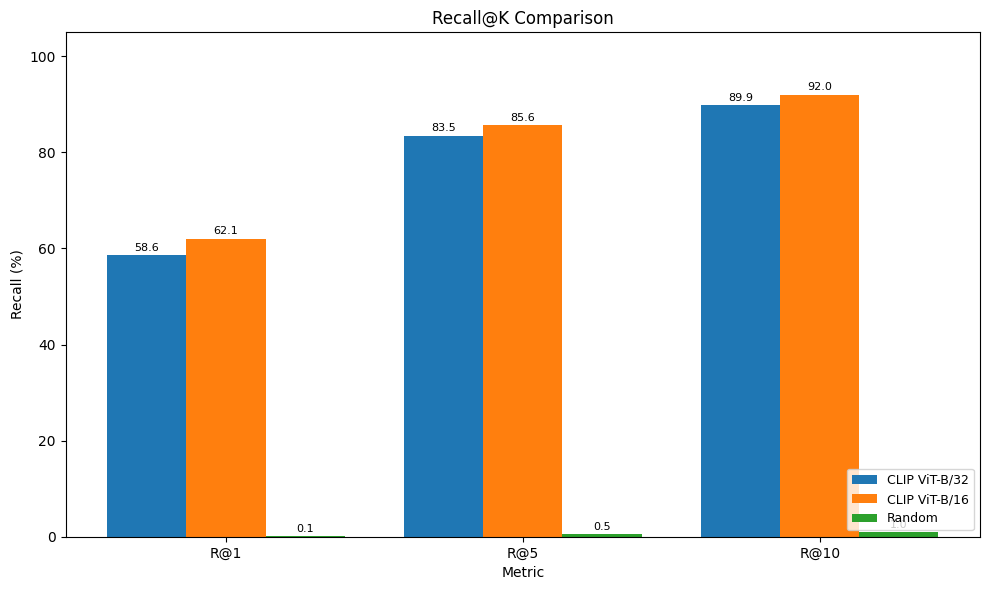

In [17]:
fig = plot_recall_comparison(all_results)
plt.show()

In [18]:
save_results(results_b32, "baseline_b32")
save_results(results_b16, "baseline_b16")

Saved results to /Users/andrejvysny/fiit/nsiete/NSIETE_2026/Project2/data/results/baseline_b32.json
Saved results to /Users/andrejvysny/fiit/nsiete/NSIETE_2026/Project2/data/results/baseline_b16.json


PosixPath('/Users/andrejvysny/fiit/nsiete/NSIETE_2026/Project2/data/results/baseline_b16.json')

## 7. Qualitative Analysis

### ViT-B/32: Best Cases (rank = 0)

In [19]:
ranks_b32 = get_ranks(txt_emb_b32, img_emb_b32, gt_indices)
print(f"Ranks shape: {ranks_b32.shape}")
print(f"Rank=0 (perfect): {(ranks_b32 == 0).sum()} / {len(ranks_b32)}")

Ranks shape: (5000,)
Rank=0 (perfect): 2929 / 5000


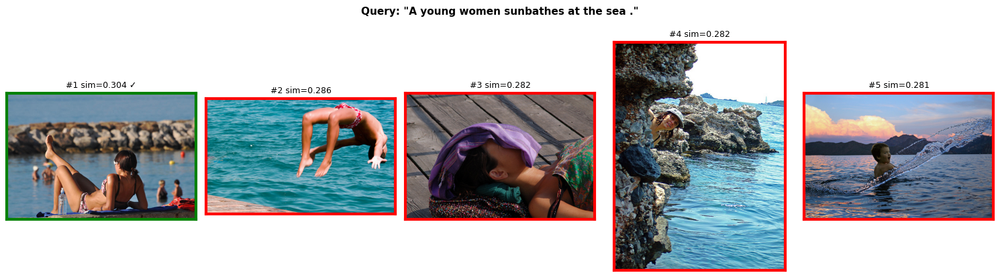

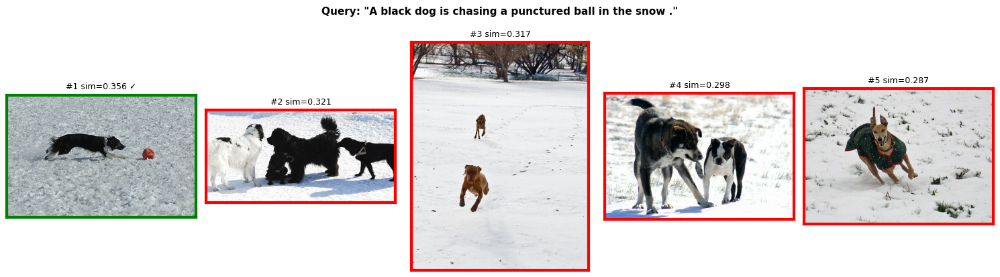

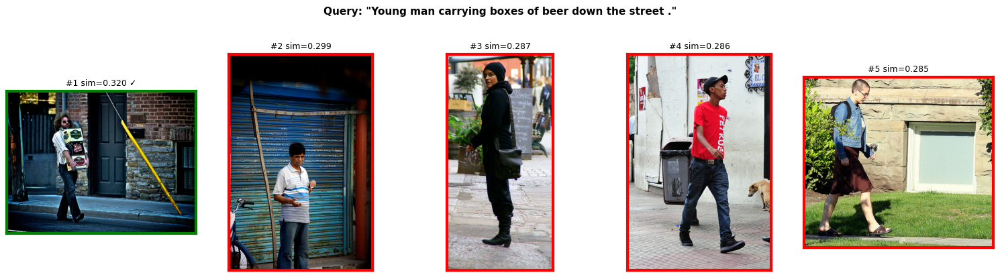

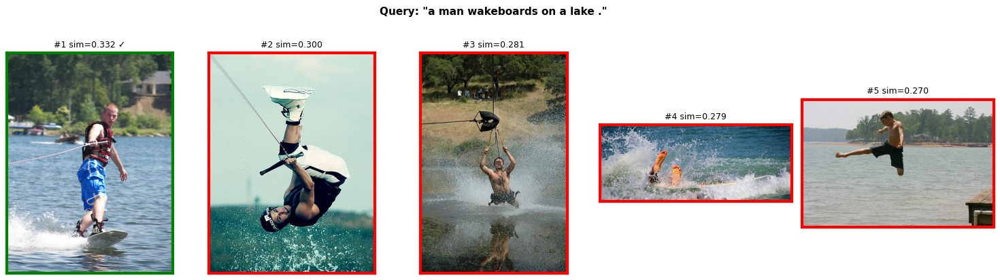

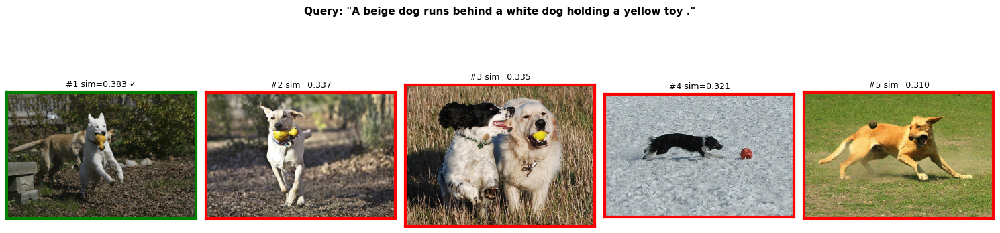

In [20]:
# Best cases: rank = 0
best_indices = np.where(ranks_b32 == 0)[0]
rng = np.random.default_rng(42)
best_sample = rng.choice(best_indices, size=min(5, len(best_indices)), replace=False)

for idx in best_sample:
    caption = test_captions[idx]
    results = text_to_image_search(txt_emb_b32[idx], img_emb_b32, top_k=5)
    fig = plot_retrieval_results(
        caption, results, splits["test"],
        ground_truth_idx=gt_indices[idx],
    )
    plt.show()

### ViT-B/32: Worst Cases (highest rank)

Rank: 507 | Caption: A young girl plays as a woman talks on phone .


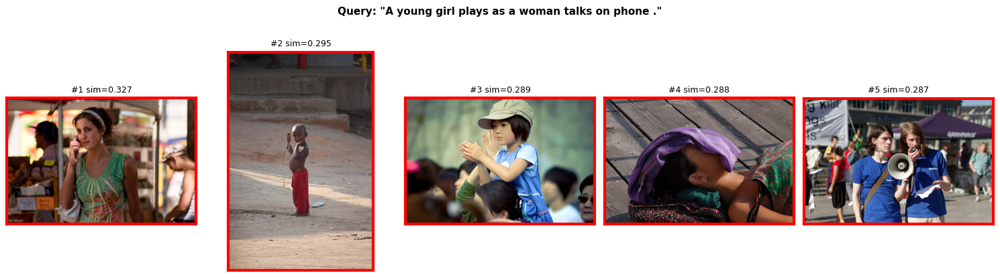

Rank: 429 | Caption: This man and women lost something and is looking for it .


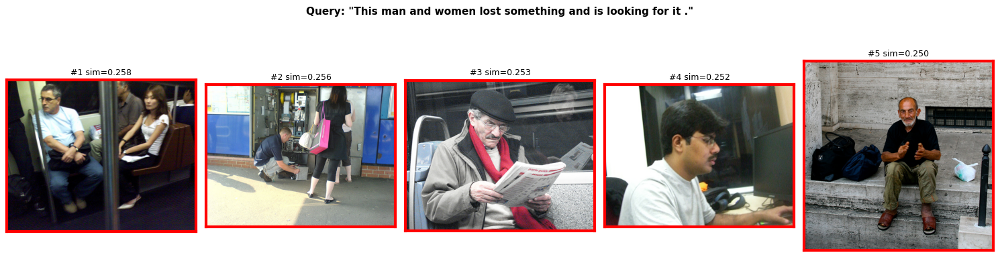

Rank: 385 | Caption: A woman and three children .


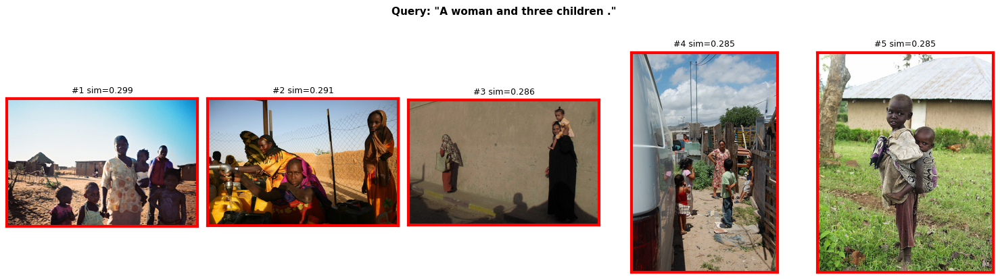

Rank: 374 | Caption: A man is drinking out of a yellow cup .


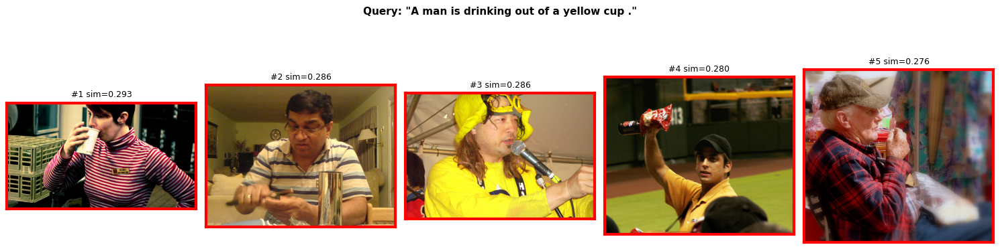

Rank: 360 | Caption: Have a quick chat and smoke break .


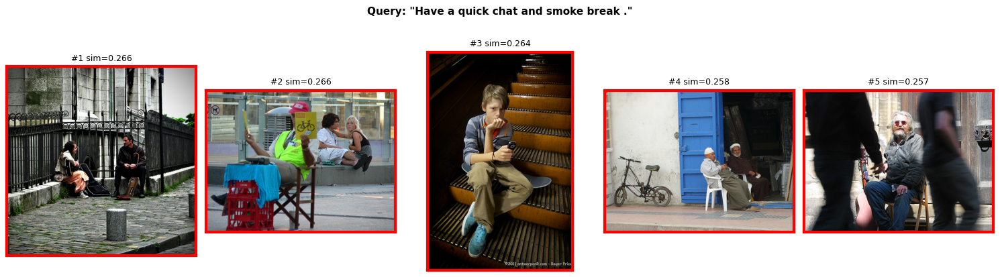

In [21]:
# Worst cases: highest rank
worst_order = np.argsort(ranks_b32)[::-1]
worst_sample = worst_order[:5]

for idx in worst_sample:
    caption = test_captions[idx]
    print(f"Rank: {ranks_b32[idx]} | Caption: {caption[:80]}")
    results = text_to_image_search(txt_emb_b32[idx], img_emb_b32, top_k=5)
    fig = plot_retrieval_results(
        caption, results, splits["test"],
        ground_truth_idx=gt_indices[idx],
    )
    plt.show()

### ViT-B/16: Selected Examples

--- B/16 Best Cases ---


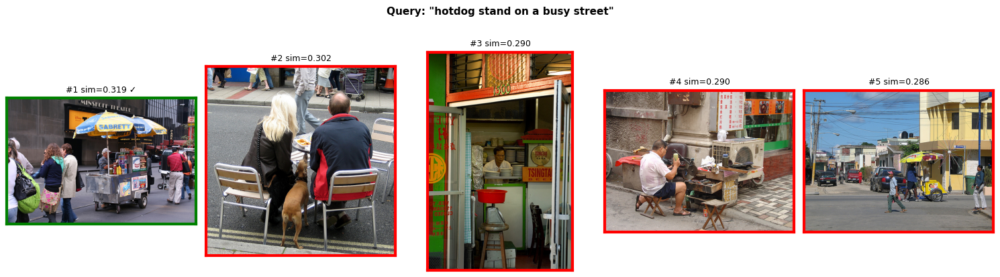

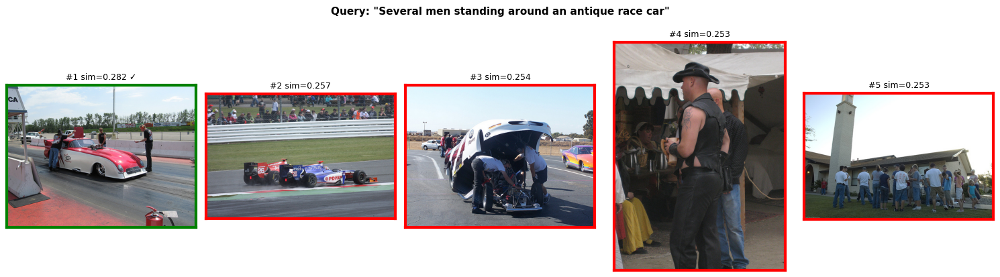


--- B/16 Worst Case (rank=334) ---
Caption: A race between friends at the park .


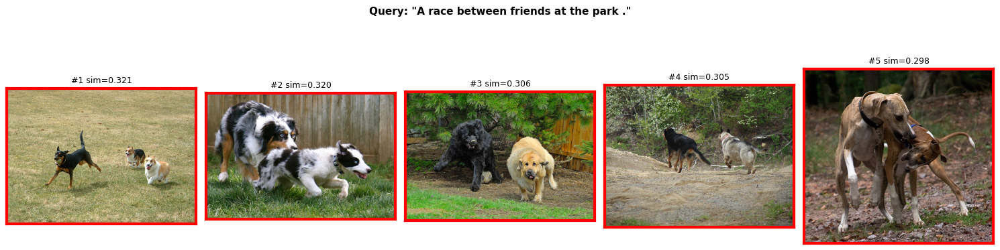

In [22]:
ranks_b16 = get_ranks(txt_emb_b16, img_emb_b16, gt_indices)

# 2 best cases
best_b16 = np.where(ranks_b16 == 0)[0]
best_sample_b16 = rng.choice(best_b16, size=min(2, len(best_b16)), replace=False)

print("--- B/16 Best Cases ---")
for idx in best_sample_b16:
    caption = test_captions[idx]
    results = text_to_image_search(txt_emb_b16[idx], img_emb_b16, top_k=5)
    fig = plot_retrieval_results(
        caption, results, splits["test"],
        ground_truth_idx=gt_indices[idx],
    )
    plt.show()

# 1 worst case
worst_b16 = np.argsort(ranks_b16)[::-1][0]
print(f"\n--- B/16 Worst Case (rank={ranks_b16[worst_b16]}) ---")
caption = test_captions[worst_b16]
print(f"Caption: {caption[:80]}")
results = text_to_image_search(txt_emb_b16[worst_b16], img_emb_b16, top_k=5)
fig = plot_retrieval_results(
    caption, results, splits["test"],
    ground_truth_idx=gt_indices[worst_b16],
)
plt.show()

## 8. Rank Distribution

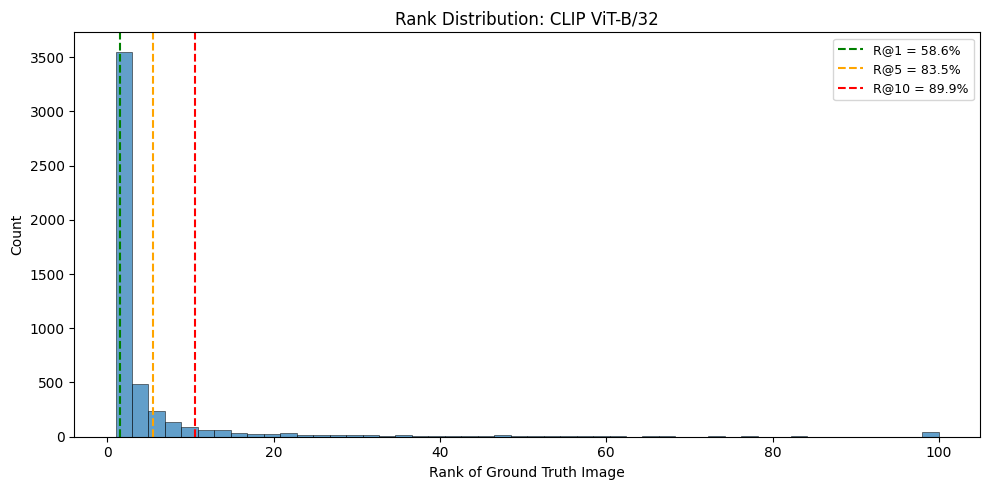

In [23]:
fig = plot_rank_distribution(ranks_b32, title="Rank Distribution: CLIP ViT-B/32")
plt.show()

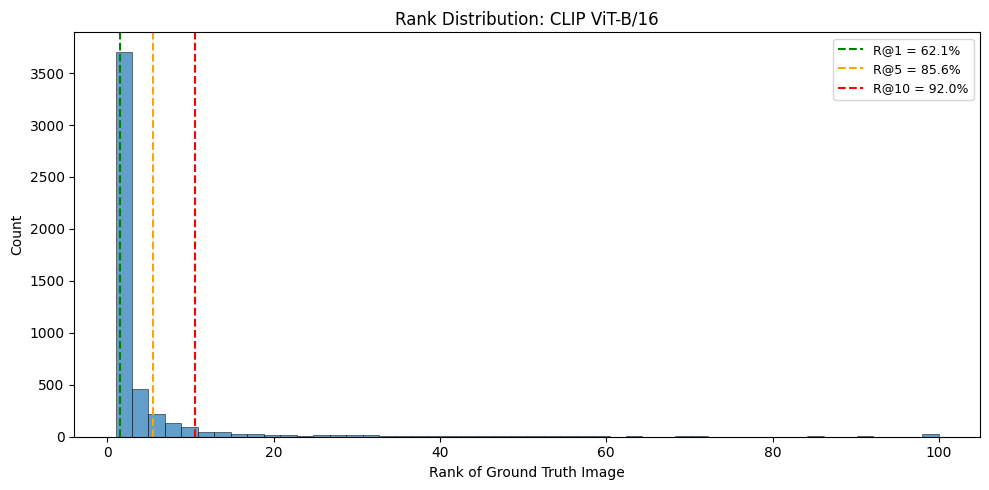

In [24]:
fig = plot_rank_distribution(ranks_b16, title="Rank Distribution: CLIP ViT-B/16")
plt.show()

In [25]:
print("Percentage of queries with GT in top-K:")
print(f"{'Model':<20} {'Top-1':>8} {'Top-5':>8} {'Top-10':>8}")
print("-" * 46)
for name, ranks in [("ViT-B/32", ranks_b32), ("ViT-B/16", ranks_b16)]:
    t1 = (ranks < 1).mean() * 100
    t5 = (ranks < 5).mean() * 100
    t10 = (ranks < 10).mean() * 100
    print(f"{name:<20} {t1:>7.1f}% {t5:>7.1f}% {t10:>7.1f}%")

Percentage of queries with GT in top-K:
Model                   Top-1    Top-5   Top-10
----------------------------------------------
ViT-B/32                58.6%    83.5%    89.9%
ViT-B/16                62.1%    85.6%    92.0%


## 9. Embedding Space Visualization

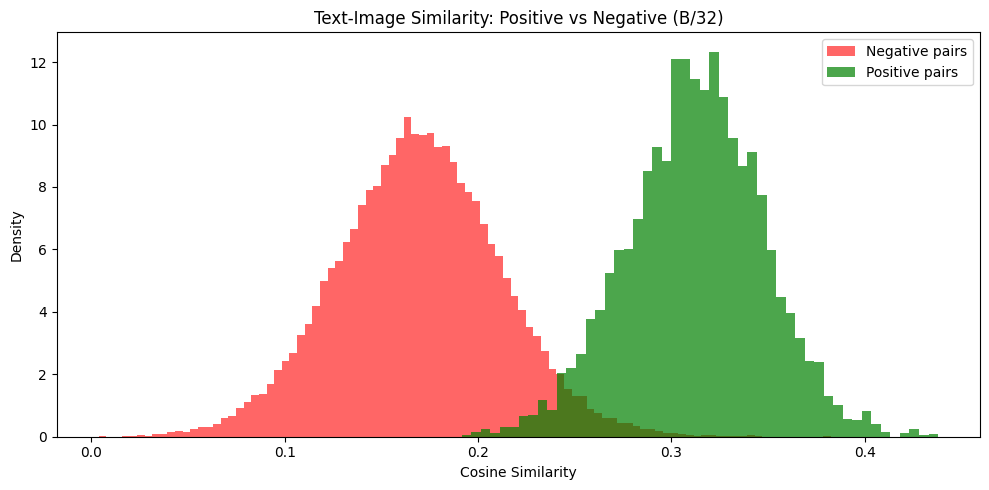

In [26]:
fig = plot_text_image_similarity_distribution(
    txt_emb_b32, img_emb_b32, gt_indices,
    title="Text-Image Similarity: Positive vs Negative (B/32)",
)
plt.show()

Running t-SNE on 1000 points...


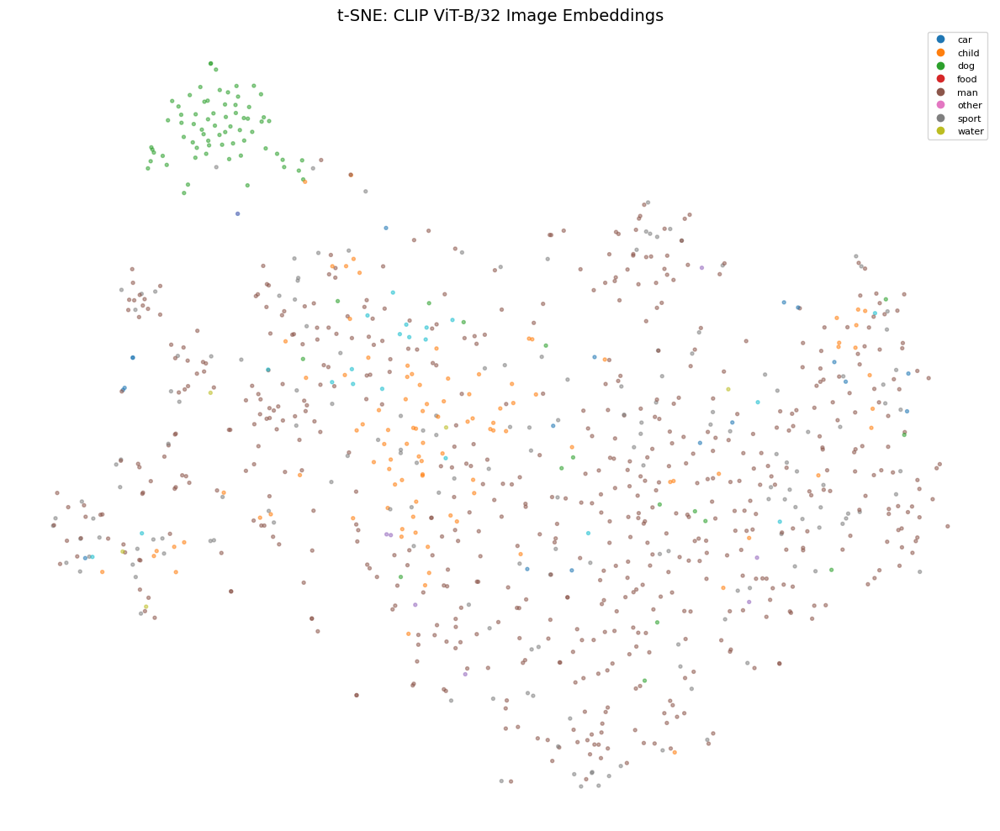

In [27]:
fig = plot_tsne(
    img_emb_b32, splits["test"],
    title="t-SNE: CLIP ViT-B/32 Image Embeddings",
    sample_size=1000,
)
plt.show()

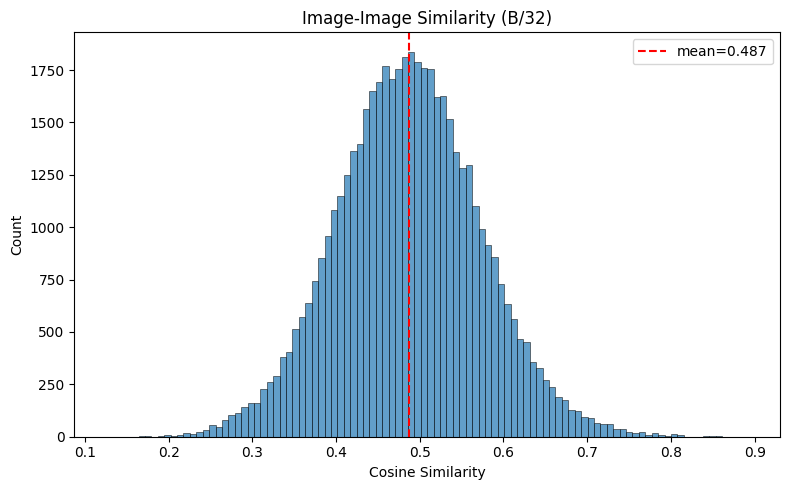

In [28]:
fig = plot_similarity_distribution(
    img_emb_b32,
    title="Image-Image Similarity (B/32)",
)
plt.show()

## 10. Summary

### B/32 vs B/16 Performance

- **ViT-B/16** uses a smaller patch size (16x16 vs 32x32), giving it finer-grained visual features. It generally achieves higher Recall@K and lower median/mean rank than B/32.
- Both models already provide strong zero-shot retrieval without any task-specific fine-tuning, far exceeding the random baseline.

### Key Observations

- **Best cases**: Queries with distinctive, concrete descriptions (specific objects, actions, colors) tend to retrieve the correct image at rank 0.
- **Worst cases**: Ambiguous or generic captions (e.g., "A man standing outside") lead to high ranks because many images match the description equally well.
- **Similarity distributions**: Positive pairs have noticeably higher cosine similarity than random negatives, but there is overlap -- this gap is what fine-tuning can improve.
- **t-SNE**: Image embeddings show some semantic clustering by content type (people, animals, scenes), though boundaries are soft.

### Next Steps

- Detailed error analysis (notebook 03): categorize failure modes
- Fine-tuning experiments: can we widen the positive/negative similarity gap?
- Investigate per-category performance differences